In [ ]:
import numpy as np
import pandas as pd
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap
from bokeh.layouts import gridplot
from bokeh.models import Slider
from matplotlib import pyplot as plt
import seaborn as sns
output_notebook()

In [ ]:


# Define the data as a dictionary
data = {
    "Key": [
        "Site.State", "Site.County", "Year", "Turbine.Capacity", "Turbine.Hub_Height",
        "Turbine.Rotor_Diameter", "Turbine.Swept_Area", "Turbine.Total_Height",
        "Project.Capacity", "Project.Number_Turbines", "Site.Latitude", "Site.Longitude"
    ],
    "Descriptions": [
        "String", "String", "Integer", "Integer", "Float",
        "Float", "Float", "Float",
        "Float", "Integer", "Float", "Float"
    ],
    "List of...": [
        "Two letter abbreviation of state where turbine is located (e.g., CA for California)",
        "County where the turbine is located.",
        "Year when the turbine's project became operational",
        "Electrical generation capacity of the turbine measured in KW (kilo-watts)",
        "Height in meters of the turbine's hub",
        "Diameter in meters of the turbine's rotor",
        "The area swept on each rotation of the turbine",
        "Total height of the turbine, in meters",
        "Electrical generation capacity of the turbine measured in MW (mega-watts)",
        "Number of turbines in this project",
        "Latitude (decimal degrees - NAD 83 datum) of where turbine is located",
        "Longitude (decimal degrees - NAD 83 datum)"
    ],
    "Example Value": [
        "IA", "Story County", 2017, 3000, 87.5,
        125.0, 12271.85, 150.0,
        30.0, 10, -93.518082, 42.01363
    ]
}

# Create a DataFrame from the dictionary
df = pd.DataFrame(data)

# Display the DataFrame
df


,Key,Descriptions,List of...,Example Value
0,Site.State,String,Two letter abbreviation of state where turbine...,IA
1,Site.County,String,County where the turbine is located.,Story County
2,Year,Integer,Year when the turbine's project became operati...,2017
3,Turbine.Capacity,Integer,Electrical generation capacity of the turbine ...,3000
4,Turbine.Hub_Height,Float,Height in meters of the turbine's hub,87.5
5,Turbine.Rotor_Diameter,Float,Diameter in meters of the turbine's rotor,125.0
6,Turbine.Swept_Area,Float,The area swept on each rotation of the turbine,12271.85
7,Turbine.Total_Height,Float,"Total height of the turbine, in meters",150.0
8,Project.Capacity,Float,Electrical generation capacity of the turbine ...,30.0
9,Project.Number_Turbines,Integer,Number of turbines in this project,10


In [ ]:
wind_turbines_df = pd.read_csv("wind_turbines.csv")

In [ ]:
wind_turbines_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63961 entries, 0 to 63960
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Site.State               63961 non-null  object 
 1   Site.County              63961 non-null  object 
 2   Year                     63961 non-null  int64  
 3   Turbine.Capacity         63961 non-null  int64  
 4   Turbine.Hub_Height       63961 non-null  float64
 5   Turbine.Rotor_Diameter   63961 non-null  float64
 6   Turbine.Swept_Area       63961 non-null  float64
 7   Turbine.Total_Height     63961 non-null  float64
 8   Project.Capacity         63961 non-null  float64
 9   Project.Number_Turbines  63961 non-null  int64  
 10  Site.Latitude            63961 non-null  float64
 11  Site.Longitude           63961 non-null  float64
dtypes: float64(7), int64(3), object(2)
memory usage: 5.9+ MB


In [ ]:
wind_turbines_df.head(5)

,Site.State,Site.County,Year,Turbine.Capacity,Turbine.Hub_Height,Turbine.Rotor_Diameter,Turbine.Swept_Area,Turbine.Total_Height,Project.Capacity,Project.Number_Turbines,Site.Latitude,Site.Longitude
0,IA,Story County,2017,3000,87.5,125.0,12271.85,150.0,30.0,10,-93.518082,42.013630
1,IA,Hardin County,2017,3000,87.5,125.0,12271.85,150.0,30.0,10,-93.367798,42.497940
2,IA,Story County,2017,3000,87.5,125.0,12271.85,150.0,30.0,10,-93.513710,42.019119
3,IA,Story County,2017,3000,87.5,125.0,12271.85,150.0,30.0,10,-93.523651,42.006813
4,IA,Story County,2017,3000,87.5,125.0,12271.85,150.0,30.0,10,-93.632835,41.882477


In [ ]:
wind_turbines_df.describe()

,Year,Turbine.Capacity,Turbine.Hub_Height,Turbine.Rotor_Diameter,Turbine.Swept_Area,Turbine.Total_Height,Project.Capacity,Project.Number_Turbines,Site.Latitude,Site.Longitude
count,63961.000000,63961.000000,63961.000000,63961.000000,63961.000000,63961.000000,63961.000000,63961.000000,63961.000000,63961.000000
mean,2011.768593,1945.300714,80.265244,94.682148,7472.673751,127.634646,171.037738,96.923172,-99.688416,38.592440
std,6.444849,689.733922,12.466083,23.449221,3267.170143,22.946809,102.126002,69.180367,11.005005,5.487171
min,1983.000000,50.000000,22.800000,14.000000,153.940000,30.400000,0.050000,1.000000,-171.713074,13.389381
25%,2008.000000,1500.000000,80.000000,82.000000,5281.020000,121.000000,100.000000,56.000000,-102.597290,34.252995
50%,2012.000000,2000.000000,80.000000,97.000000,7389.810000,130.100000,160.000000,85.000000,-99.329704,39.316921
75%,2017.000000,2300.000000,85.000000,110.000000,9503.320000,144.500000,211.220000,120.000000,-94.947594,42.991066
max,2021.000000,6000.000000,131.000000,155.000000,18869.190000,199.600000,525.020000,460.000000,144.722656,66.839905


## Year vs Turbine.Capacity


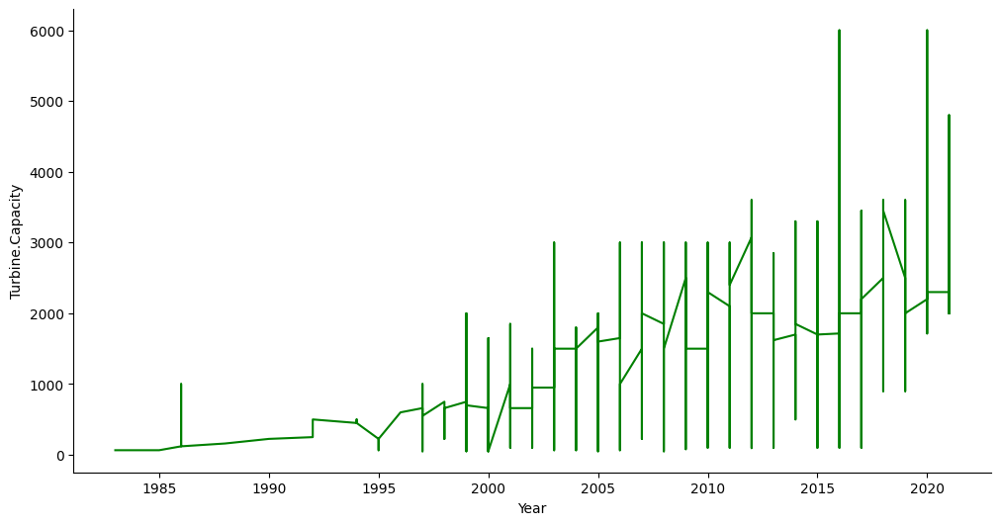

In [ ]:
def _plot_series(series, series_name, series_index=0):
  xs = series['Year']
  ys = series['Turbine.Capacity']

  plt.plot(xs, ys, label=series_name, color='green')

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = wind_turbines_df.sort_values('Year', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Turbine.Capacity')

## Turbine.Capacity vs Turbine.Hub_Height


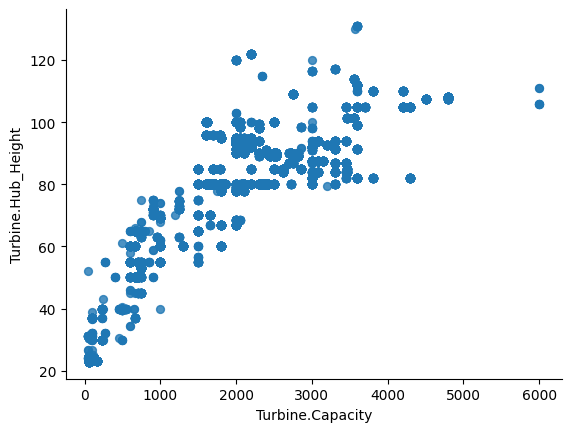

In [ ]:

wind_turbines_df.plot(kind='scatter', x='Turbine.Capacity', y='Turbine.Hub_Height', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

## Bar Plot: Average Turbine Capacity by State

In [ ]:
# Bar Plot: Average Turbine Capacity by State
state_capacity = wind_turbines_df.groupby('Site.State')['Turbine.Capacity'].mean().reset_index()
state_capacity['Site.State'] = state_capacity['Site.State'].astype(str)
state_source = ColumnDataSource(state_capacity)
tools = "hover, box_zoom, undo, crosshair"

bar_plot = figure(x_range=state_capacity['Site.State'], height=400, width=800, title="Average Turbine Capacity by State",
                  toolbar_location=None, tools=tools)

bar_plot.vbar(x='Site.State', top='Turbine.Capacity', width=0.9, source=state_source, legend_field="Site.State",
              line_color='white', fill_color=factor_cmap('Site.State', palette="Viridis256", factors=state_capacity['Site.State']))

bar_plot.y_range.start = 0
bar_plot.xgrid.grid_line_color = None
bar_plot.legend.orientation = "horizontal"
bar_plot.legend.location = "top_center"
bar_plot.xaxis.major_label_orientation = 1.2
show(bar_plot)

## Line Plot: Turbine Capacity Over Years

In [ ]:

year_capacity = wind_turbines_df.groupby('Year')['Turbine.Capacity'].mean().reset_index()
year_source = ColumnDataSource(year_capacity)

line_plot = figure(height=400, width=800, title="Average Turbine Capacity Over Years")
line_plot.line('Year', 'Turbine.Capacity', source=year_source, line_width=2)
line_plot.scatter('Year', 'Turbine.Capacity', size=8, source=year_source, fill_color="white")
line_plot.add_tools(HoverTool(tooltips=[("Year", "@Year"), ("Capacity", "@{Turbine.Capacity}")]))
show(line_plot)

## Scatter Plot: Hub Height vs. Rotor Diameter

In [ ]:

scatter_source = ColumnDataSource(wind_turbines_df)

scatter_plot = figure(height=400, width=800, title="Hub Height vs. Rotor Diameter", tools="pan,wheel_zoom,box_zoom,reset,hover,save")
scatter_plot.scatter('Turbine.Hub_Height', 'Turbine.Rotor_Diameter', source=scatter_source, size=5, color="navy", alpha=0.5)
scatter_plot.xaxis.axis_label = 'Hub Height (m)'
scatter_plot.yaxis.axis_label = 'Rotor Diameter (m)'
show(scatter_plot)

In [ ]:
!pip install pyproj

In [ ]:
# Required Imports

from bokeh.tile_providers import get_provider, Vendors

from pyproj import Transformer

# Example DataFrame
data = {
    'Site.Longitude': [-93.518082],
    'Site.Latitude': [42.01363]
}
wind_turbines_df = pd.DataFrame(data)

# Set up Bokeh for notebook output
output_notebook()

# Geographical Plot: Locations of Wind Turbines
geo_plot = figure(height=400, width=800, title="Wind Turbine Locations",
                  x_axis_type="mercator", y_axis_type="mercator",
                  tools="pan,wheel_zoom,reset")

# Adding tile provider
tile_provider = get_provider(Vendors.CARTODBPOSITRON)
geo_plot.add_tile(tile_provider)

# Converting latitude and longitude to Web Mercator coordinates for mapping
transformer = Transformer.from_crs("epsg:4326", "epsg:3857")
wind_turbines_df['x'], wind_turbines_df['y'] = transformer.transform(wind_turbines_df['Site.Latitude'].values, wind_turbines_df['Site.Longitude'].values)

# Plotting wind turbine locations
geo_plot.circle('x', 'y', size=5, source=ColumnDataSource(wind_turbines_df), color="red", alpha=0.5)

# Display the plot
show(geo_plot)


In [ ]:
slider = Slider(start=0, end=10, value=1, step=0.1, title="Slider Example")
# Combine plots into a grid layout
layout = gridplot([[scatter_plot,line_plot,bar_plot,geo_plot,slider]])
show(layout)